# Visualization of $K_0$ Discontinuities

In [3]:
!pip install seaborn

     |████████████████████████████████| 293 kB 4.0 MB/s eta 0:00:01


In [4]:
import os
import re
import torch
import pickle
import numpy as np
from pathlib import Path
from sklearn.decomposition import PCA
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
DATA_DIR = Path("../data/k0/sentiment-analysis")

In [6]:
labels = pickle.load(open(DATA_DIR / "labels.pkl", "rb"))
# convert all of the labels to ints 
labels = [int(v) for v in labels]

## Preprocessing
- We load the ground truth labels, logits from the neural network, and activations from each layer of the neural network. 
- Re-arrange the activations from the neural network by layer. This is because the aforementioned values are generated by batching and data point first.
- Apply softmax to the logits and only get the probabilities corresponding to the correct label.

In [7]:
# load the activation data and the predictions
MODEL_NAME = "bert-base-uncased-imdb"
activations = pickle.load(open(DATA_DIR / f"{MODEL_NAME}-k0.pkl", "rb"))

In [8]:
logits = torch.cat([v[0] for v in activations])  # load all of the logits
acts = []
for i in range(len(activations[0][1])):  # load activations and organize them by layer
    layer_act = []
    for v in activations:
        layer_act.append(v[1][i])
    acts.append(torch.cat(layer_act))

In [9]:
# apply softmax to the logits to get raw probabilities
def softmax(x):
    return torch.exp(x) / torch.sum(torch.exp(x), axis=1).reshape(-1,1)

In [10]:
# we only care about the probabilites that correspond to the correct label
predicted_probs = softmax(logits)[torch.arange(len(logits)),labels]

## Probability with PCA-ed Activations
- We plot the probability that the model predicts correctly for a given data point with the PCA-ed (2 dimension) of that data point.
- The purpose of these plots is to give us a general idea of the density of the low-performance points and to see if they are clustered/or scattered. 
- These plots also will give insight into the density of the representation spaces themselves. 

In [37]:
len(acts)

13

In [32]:
# PCA the first layer activations 
pca = PCA(n_components=2)

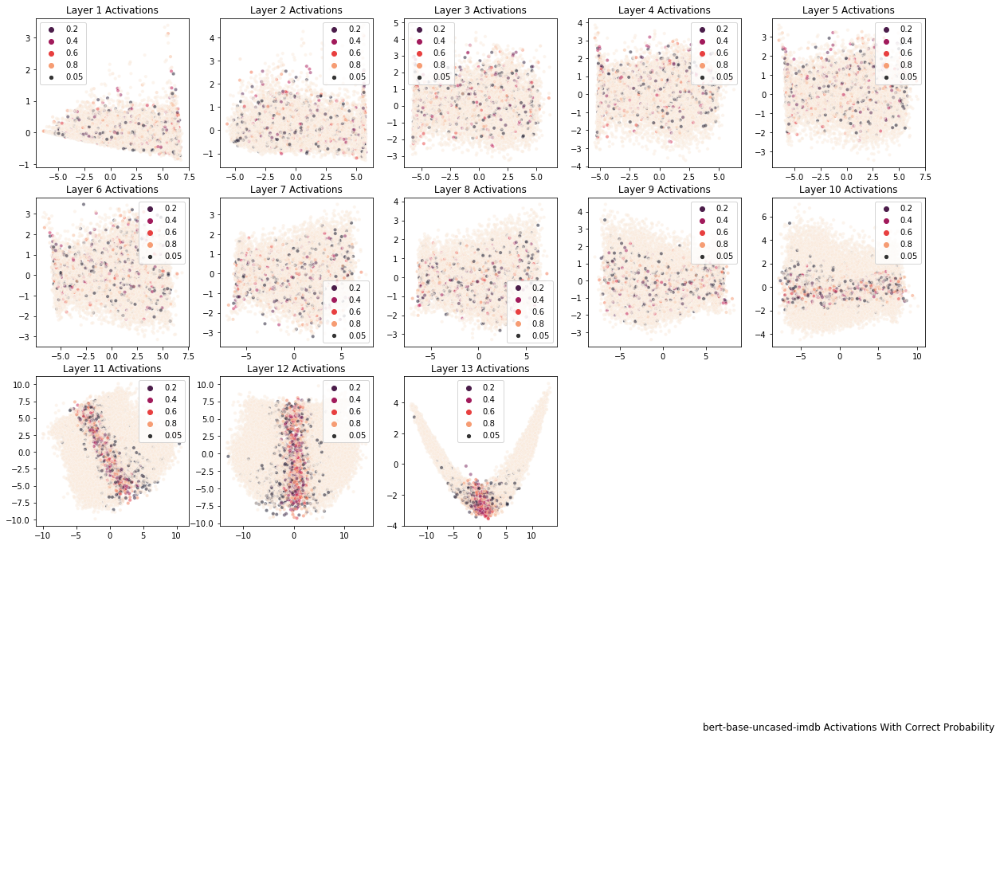

In [38]:
fig, axs = plt.subplots(5,5, figsize=(20,20))
plt.title(f"{MODEL_NAME} Activations With Correct Probability")
for i, act in enumerate(acts):
    two_dim_act = pca.fit_transform(act)
    ax = axs.flat[i]
    ax.set_title(f"Layer {i+1} Activations")
    sns.scatterplot(
        x=two_dim_act[:,0],
        y=two_dim_act[:,1],
        hue=predicted_probs,size=0.05,
        palette="rocket",
        alpha=0.5,
        ax=axs.flat[i]
    )
for i in range(len(acts),len(axs.flat)):
    axs.flat[i].axis("off")
plt.savefig(f"../data/k0/figures/{MODEL_NAME}-activations.png")

Plot the actual labels vs. the embedded positions.

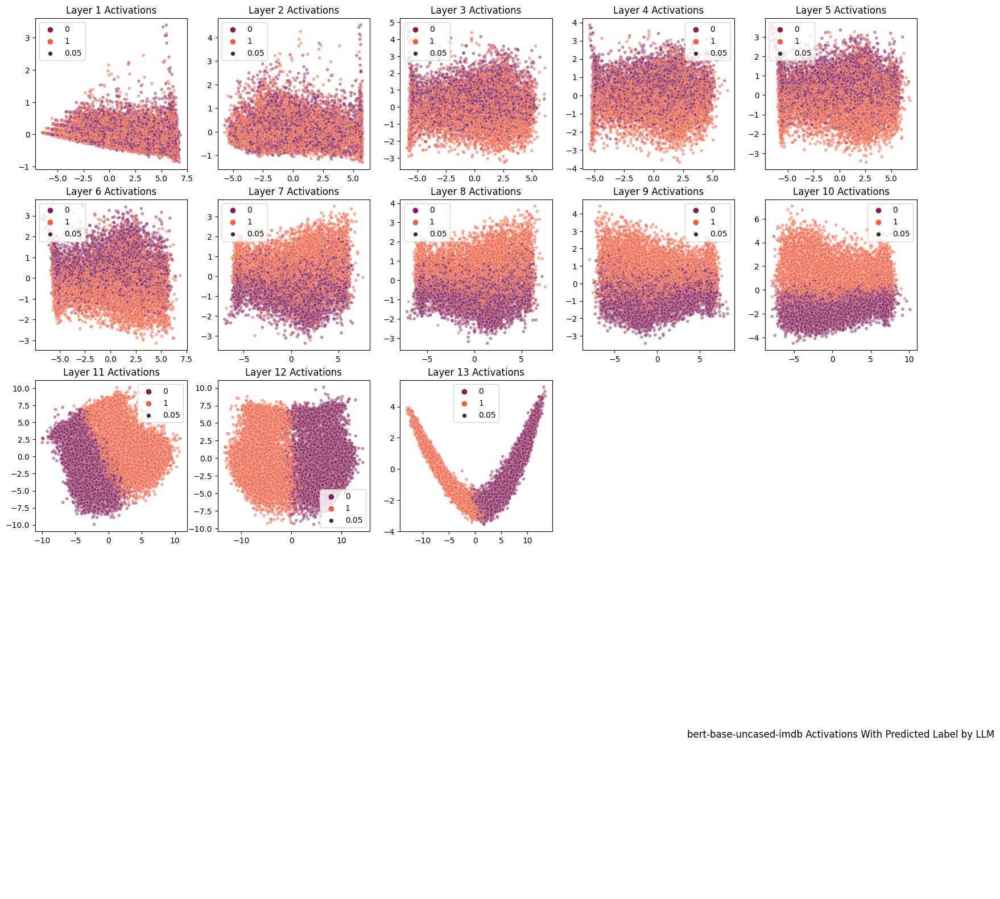

In [175]:
fig, axs = plt.subplots(5,5, figsize=(20,20))
plt.title(f"{MODEL_NAME} Activations With Predicted Label by LLM")
for i, act in enumerate(acts):
    two_dim_act = pca.fit_transform(act)
    ax = axs.flat[i]
    ax.set_title(f"Layer {i+1} Activations")
    sns.scatterplot(
        x=two_dim_act[:,0],
        y=two_dim_act[:,1],
        hue=torch.argmax(logits,axis=1),size=0.05,
        palette="rocket",
        alpha=0.5,
        ax=axs.flat[i]
    )
for i in range(len(acts),len(axs.flat)):
    axs.flat[i].axis("off")
plt.savefig(f"../data/k0/figures/{MODEL_NAME}-activations.png")

# Calculate $K0$ Discontinuities
- We first normalize all data points so they fall in the unit ball. We do this by simply diving all vectors by the maximum norm in the dataset. 
- We use the definition of $K0$ discontinuity to identify all discontinuities:
$$
    \textbf{Exp}_{(x,y)\sim \mathcal{D_{1-\delta}(x)}}\left[\frac{|yC(x) - y'C(x')|}{1 + \lVert C_j(x') - C_j(x)\rVert}\right] \geq \delta,
$$
where $D_{1-\delta}(x)$ data distribution with support of the open ball centered at $x$ with radius $1-\delta$. 
- We progressively use a larger and larger $\delta$ and try to observe emergent properties from this. 
- We want to make sure that the discontinuities don't all lie on the decision boundary.

In [61]:
for layer in range(0, 13):

    # load all of the discontinuities from pretrained files
    fldr_name = DATA_DIR / f"bert-base-uncased-imdb-k0-l{layer + 1}"
    target_files = [v for v in os.listdir(fldr_name) if (("delta" in v) and (MODEL_NAME in v))]
    # extract the delta value from the filenames 
    deltas = [
        float(re.search(r"(([0-9]*[.])?[0-9]+).pkl", v).group(1)) 
        for v in target_files
    ]
        
    # load the target files and then count the number of discontinuities
    num_disconts = []
    for f in target_files:
        disconts = pickle.load(
            open(fldr_name / f, "rb")
        )
        num_disconts.append(sum(disconts))
    
    plt.title(f"Delta curve for layer {layer + 1}")
    #plt.yscale("log")
    sns.lineplot(x=deltas, y=[v+1 for v in num_disconts])
    plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '../data/k0/sentiment-analysis/bert-base-uncased-imdb-k0-l1'

Plot the actual discontinuities on the embedding space

In [53]:
delta = 0.17324137931034483
disconts = pickle.load(open(fldr_name / f"bert-base-uncased-imdb-k0-delta-{delta}.pkl", "rb"))

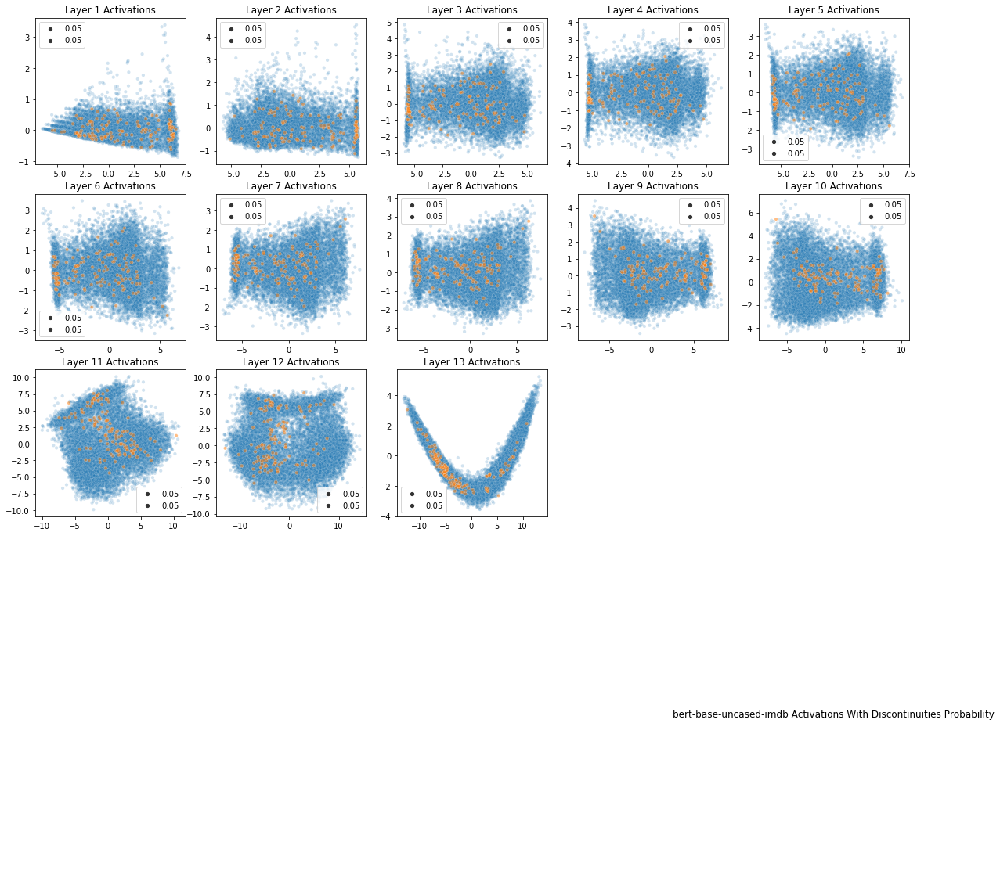

In [54]:
fig, axs = plt.subplots(5,5, figsize=(20,20))
plt.title(f"{MODEL_NAME} Activations With Discontinuities Probability")
for i, act in enumerate(acts):
    two_dim_act = pca.fit_transform(act)
    ax = axs.flat[i]
    ax.set_title(f"Layer {i+1} Activations")
    plt_non_disconts = np.where(disconts==0)[0]
    plt_disconts = np.where(disconts==1)[0]
    
    #print(act)
    #print(disconts)
    #print(np.where(disconts==0))
    #print(non_disconts)
    #print(two_dim_act[non_disconts])
    
    sns.scatterplot(
        x=two_dim_act[plt_non_disconts][:,0],
        y=two_dim_act[plt_non_disconts][:,1],
        size=0.05,
        alpha=0.2,
        ax=axs.flat[i]
    )
    sns.scatterplot(
        x=two_dim_act[plt_disconts][:,0],
        y=two_dim_act[plt_disconts][:,1],
        size=0.05,
        alpha=0.5,
        ax=axs.flat[i]
    )
for i in range(len(acts),len(axs.flat)):
    axs.flat[i].axis("off")
#plt.savefig(f"../data/k0/figures/{MODEL_NAME}-activations.png")

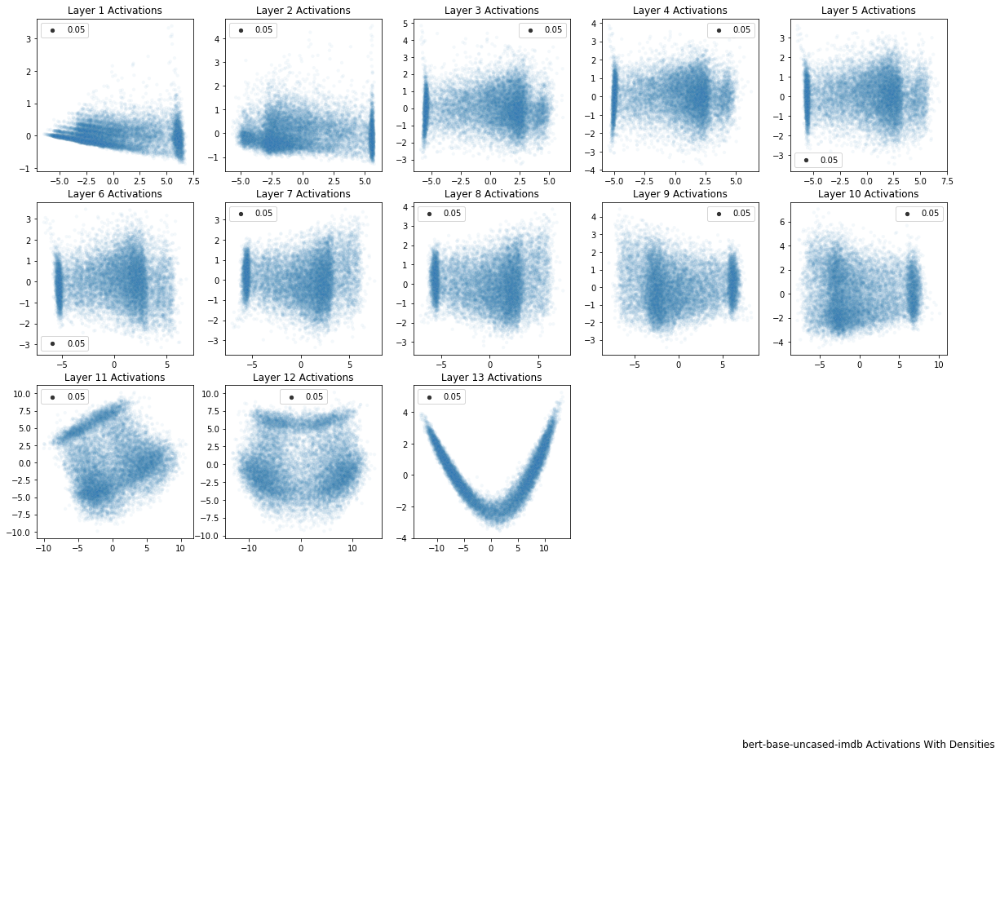

In [56]:
"""
Plot densities
"""

fig, axs = plt.subplots(5,5, figsize=(20,20))
plt.title(f"{MODEL_NAME} Activations With Densities")
for i, act in enumerate(acts):
    two_dim_act = pca.fit_transform(act)
    ax = axs.flat[i]
    ax.set_title(f"Layer {i+1} Activations")
    
    sns.scatterplot(
        x=two_dim_act[:,0],
        y=two_dim_act[:,1],
        size=0.05,
        alpha=0.05,
        ax=axs.flat[i]
    )
for i in range(len(acts),len(axs.flat)):
    axs.flat[i].axis("off")
#plt.savefig(f"../data/k0/figures/{MODEL_NAME}-densities.png")

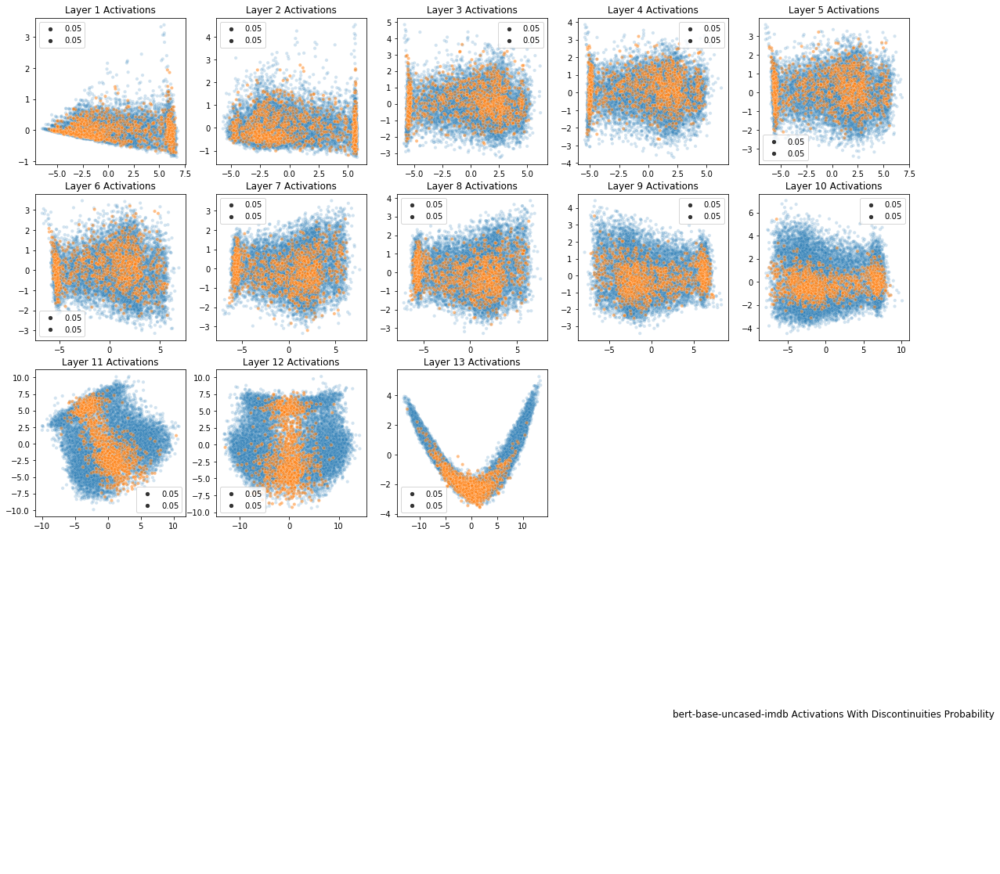

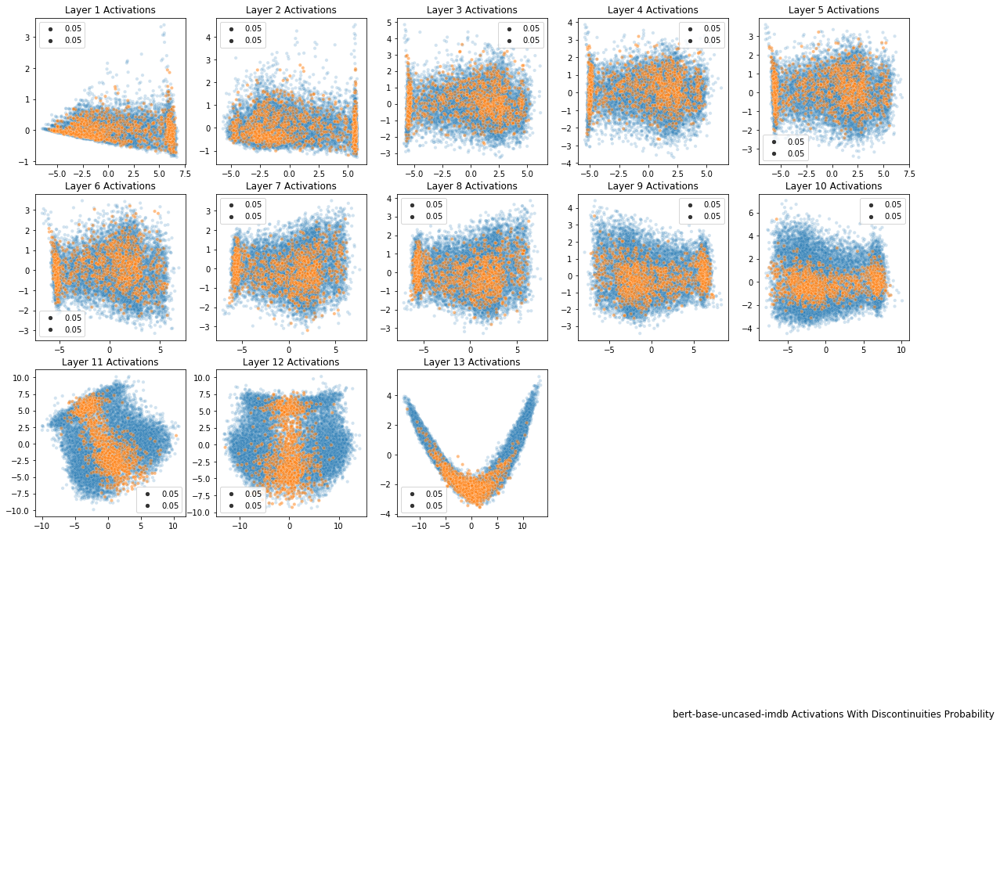

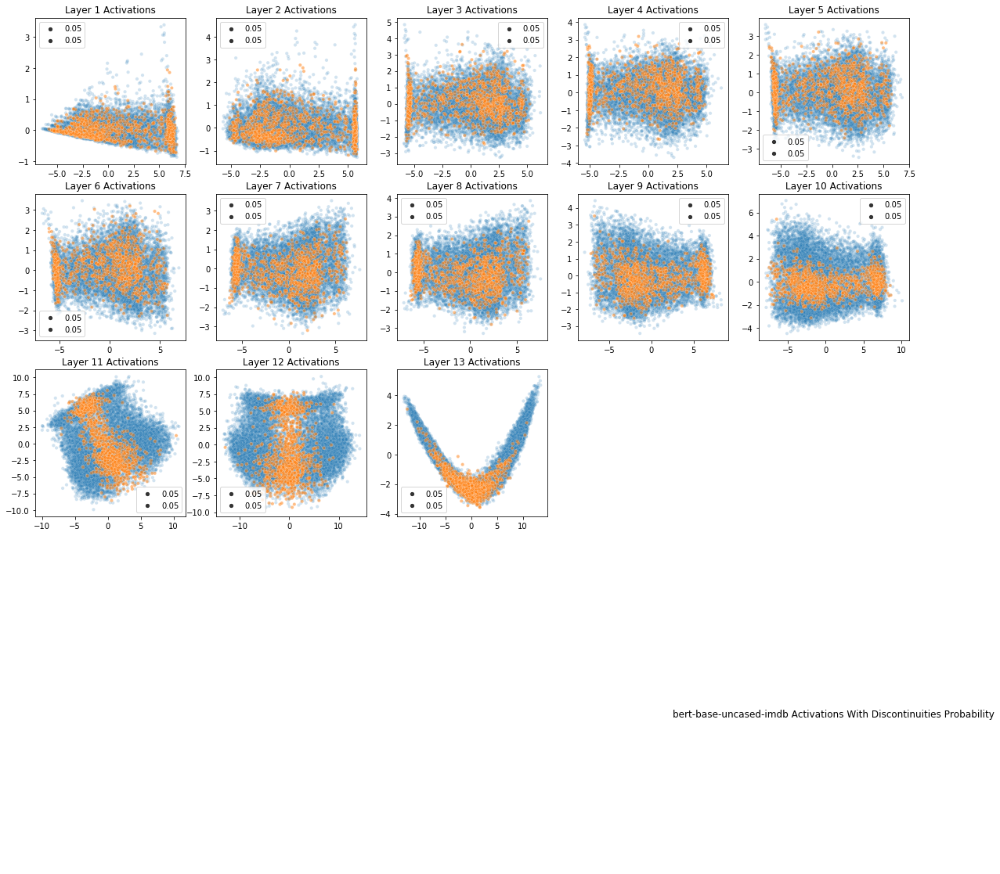

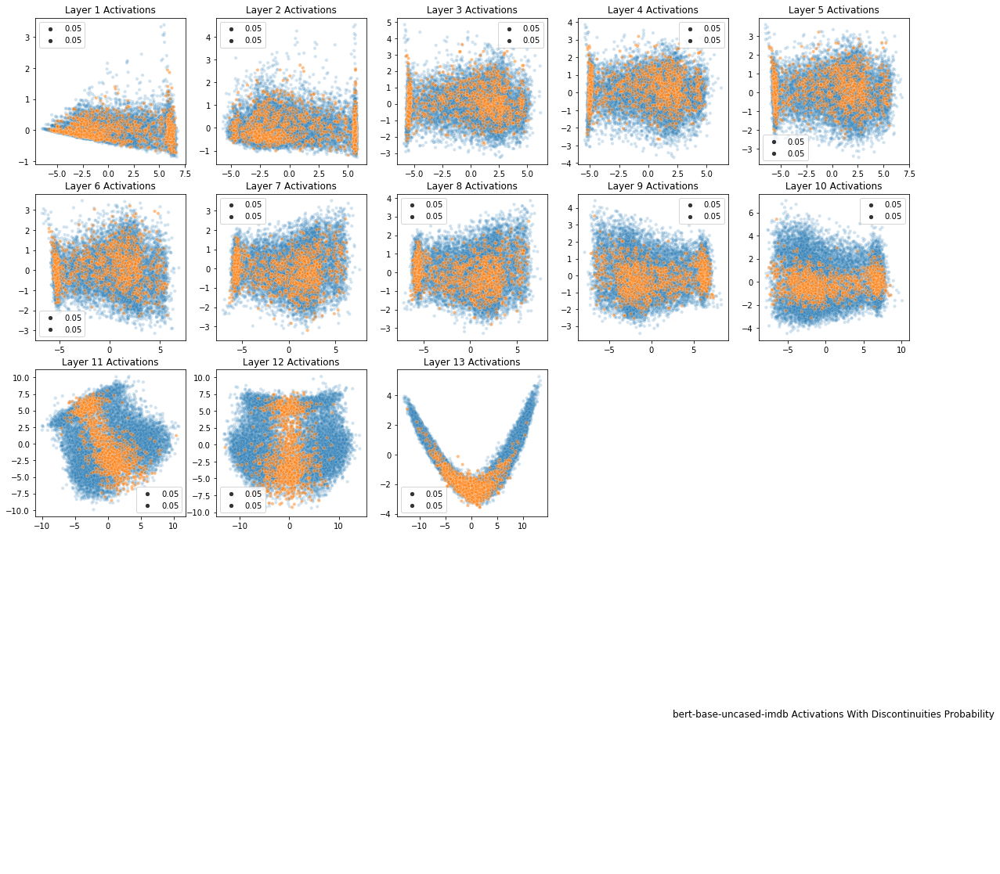

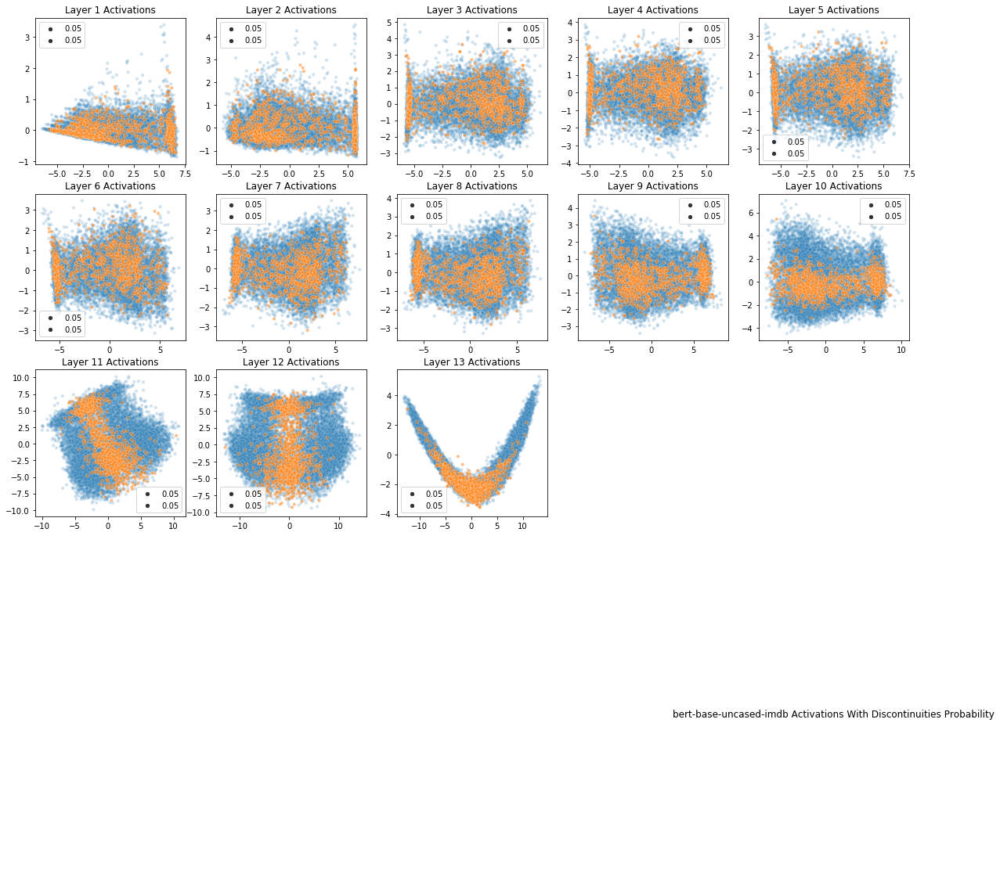

...

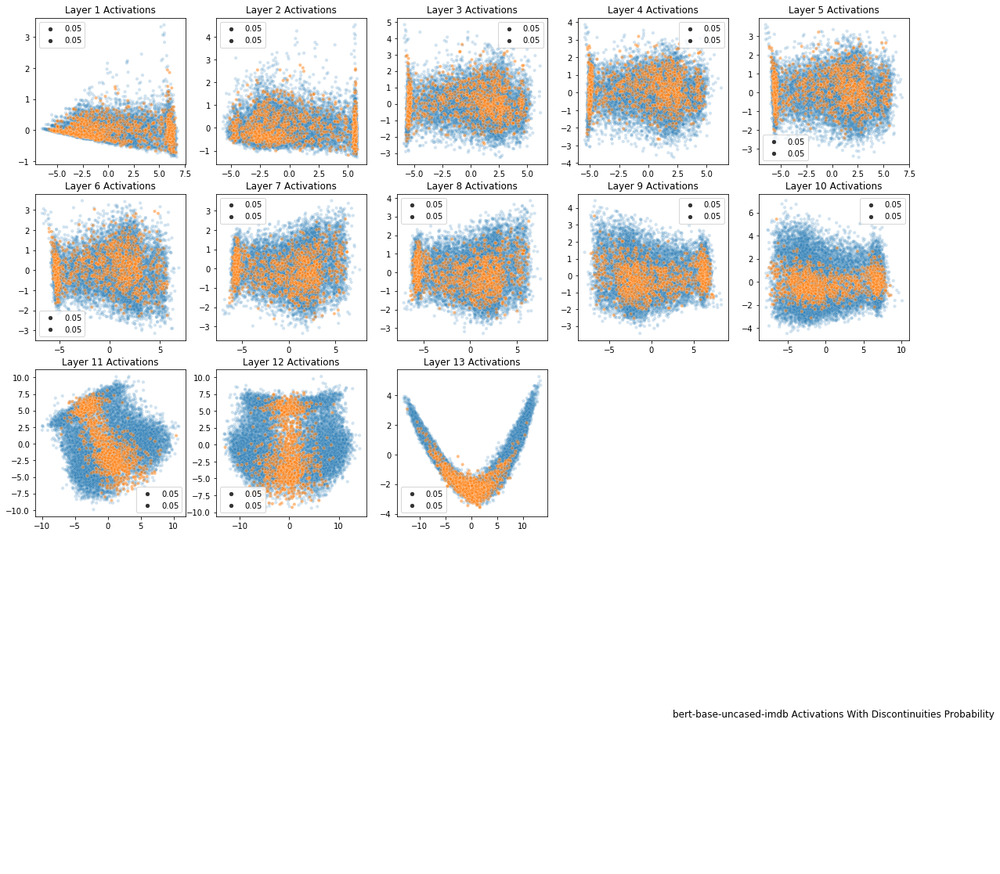

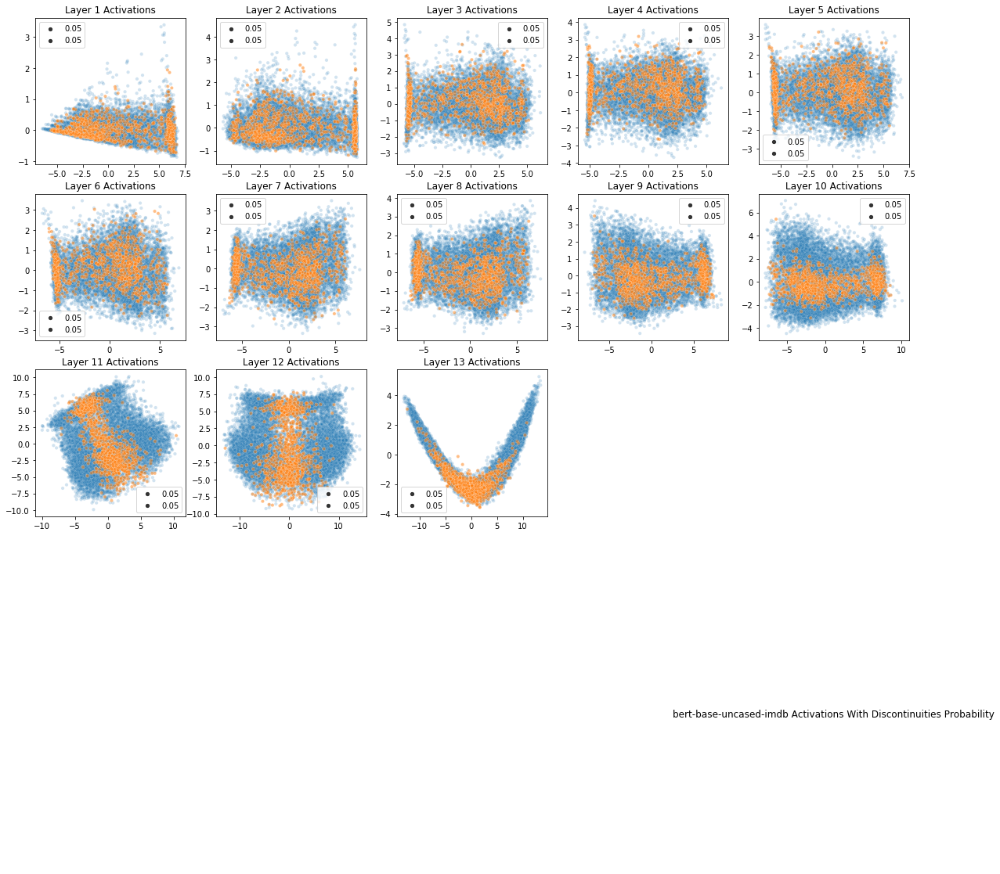

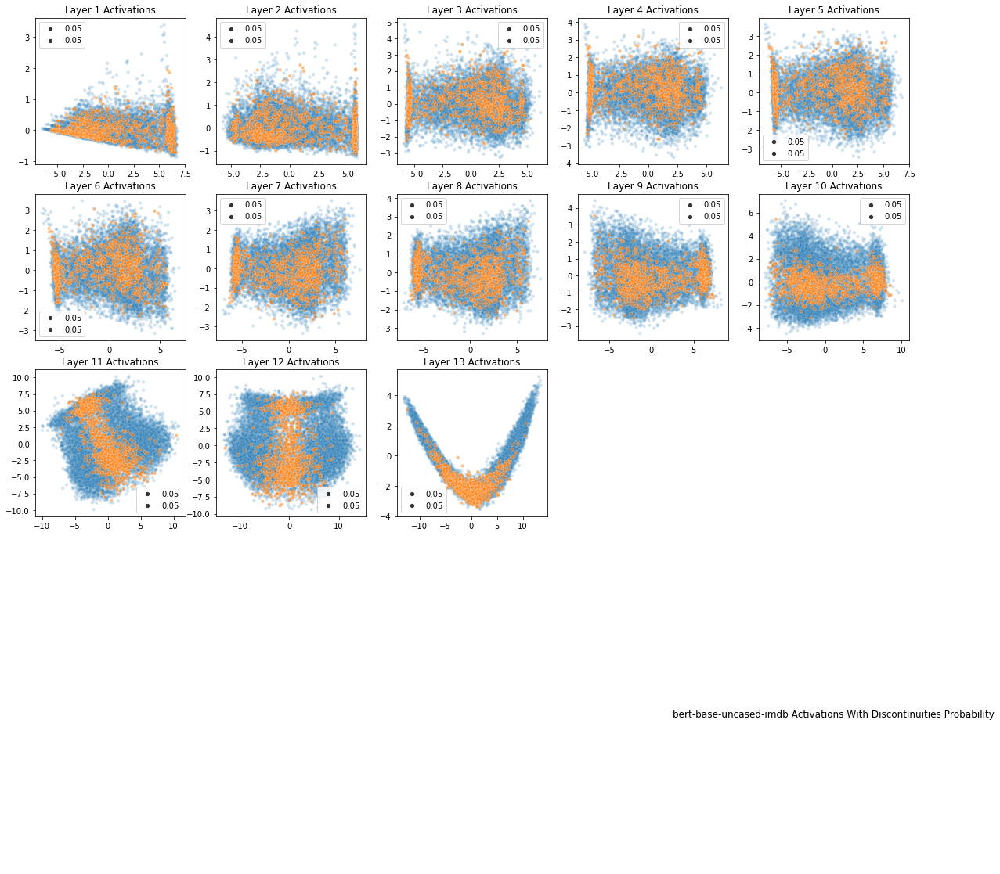

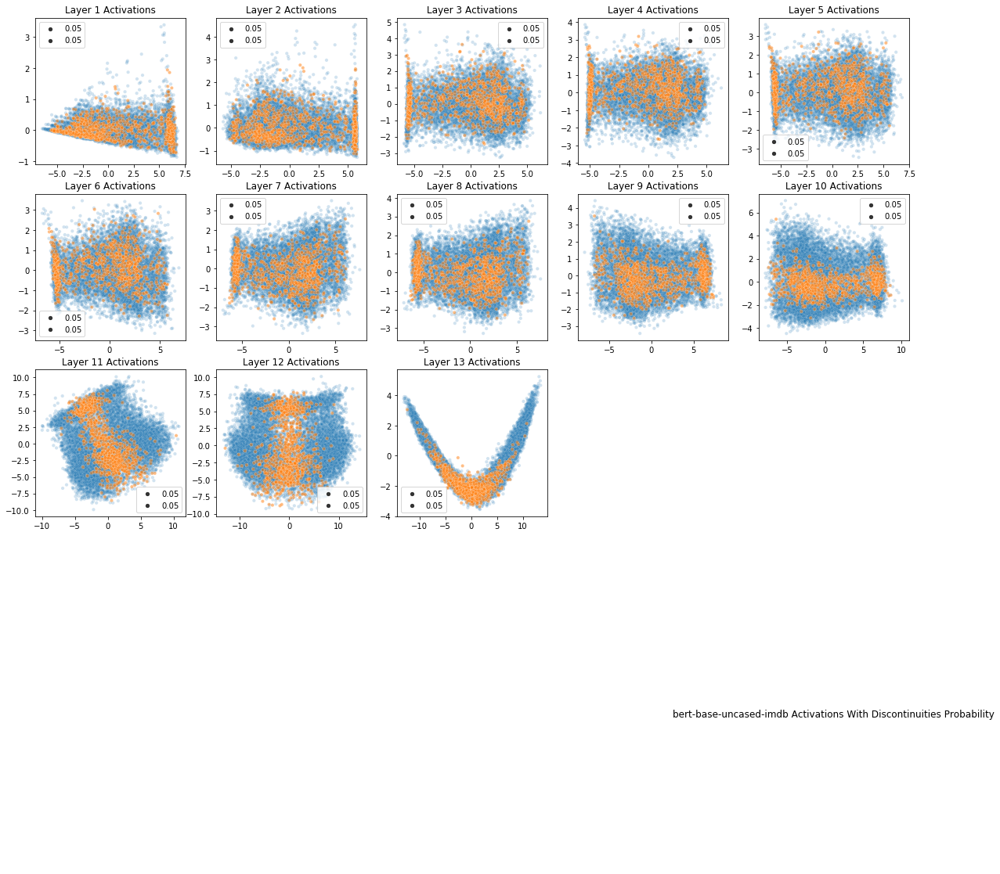

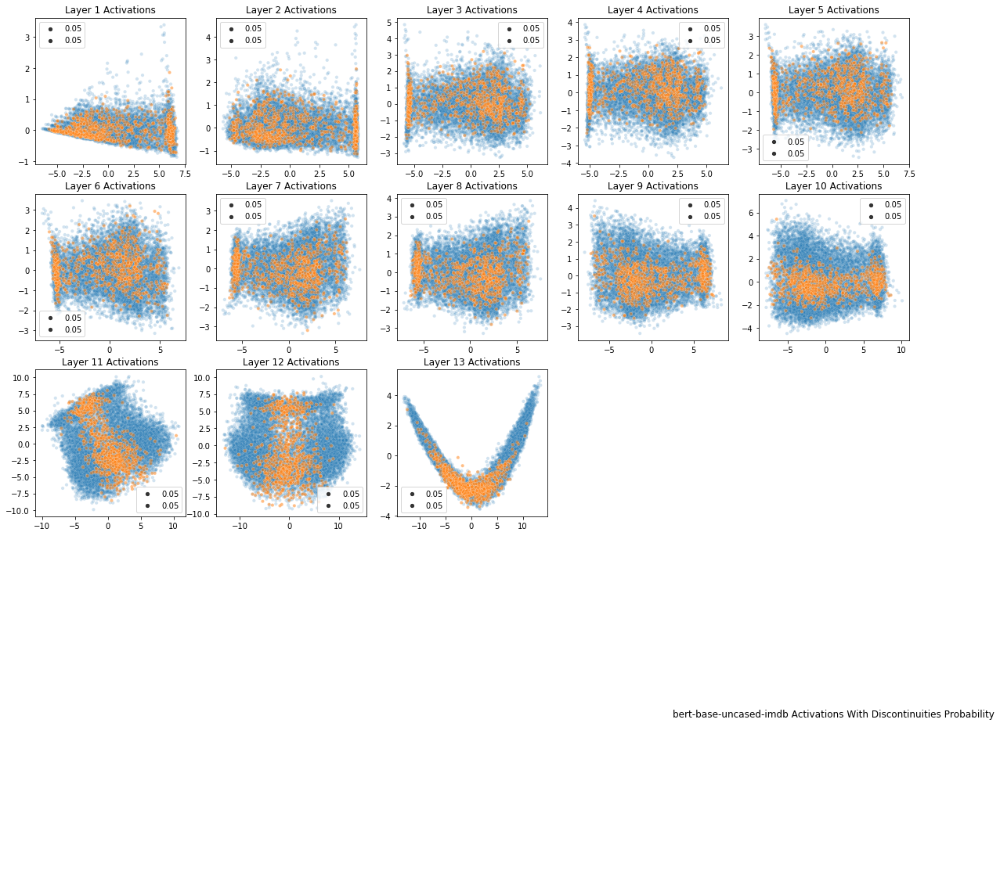

In [57]:
for layer in range(0, 13):
    fldr_name = DATA_DIR / f"bert-base-uncased-imdb-k0-l{layer + 1}"
    delta = 0.31103448275862067
    disconts = pickle.load(open(fldr_name / f"bert-base-uncased-imdb-k0-delta-{delta}.pkl", "rb"))
    fig, axs = plt.subplots(5,5, figsize=(20,20))
    plt.title(f"{MODEL_NAME} Activations With Discontinuities Probability")
    for i, act in enumerate(acts):
        two_dim_act = pca.fit_transform(act)
        ax = axs.flat[i]
        ax.set_title(f"Layer {i+1} Activations")
        plt_non_disconts = np.where(disconts==0)[0]
        plt_disconts = np.where(disconts==1)[0]

        sns.scatterplot(
            x=two_dim_act[plt_non_disconts][:,0],
            y=two_dim_act[plt_non_disconts][:,1],
            size=0.05,
            alpha=0.2,
            ax=axs.flat[i]
        )
        sns.scatterplot(
            x=two_dim_act[plt_disconts][:,0],
            y=two_dim_act[plt_disconts][:,1],
            size=0.05,
            alpha=0.5,
            ax=axs.flat[i]
        )
    for i in range(len(acts),len(axs.flat)):
        axs.flat[i].axis("off")

In [ ]:
"""
Discontinuities that are shared across layers
"""

In [64]:
shared_disconts = None
total_disconts = None

for layer in range(0, 13):
    fldr_name = DATA_DIR / f"bert-base-uncased-imdb-k0-l{layer + 1}"
    delta = 0.31103448275862067
    disconts = pickle.load(open(fldr_name / f"bert-base-uncased-imdb-k0-delta-{delta}.pkl", "rb"))
    discont = np.where(discont == 1)
    if shared_disconts is None:
        shared_disconts = disconts
        total_disconts = disconts
    shared_disconts = np.intersect1d(shared_disconts, disconts)
    total_disconts = np.union1d(total_disconts, disconts)

print(len(shared_disconts))
print(len(total_disconts))

FileNotFoundError: [Errno 2] No such file or directory: '../data/k0/sentiment-analysis/bert-base-uncased-imdb-k0-l1/bert-base-uncased-imdb-k0-delta-0.31103448275862067.pkl'